# Fingerprint GAN Research

This document contains some of the work for my Master's from 2021, which I never finished. I ended up lossig some of my work, so I had to create it. 

## Introduction

An open problem in the area of Latent Fingerprint Recognition is the enhancement of poor quality fingerprints for the purpose of improving fingerprint matching accuracy. Although there a lots of algorithms out there to enhance fingerprint images, the results of some of the best solutions are less than satisfactory. For this reason, my research was on the use of Generative Adversarial Networks for the purpose of enhacing images of latent fingerprints for improving matching accuracy.

This GAN was adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. It is similar to traditional GANs.

## Install Dependencies

In [1]:
!pip install Augmentor
!pip install pillow
!pip install seaborn
%reload_ext autoreload
%autoreload

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset

import torchvision.utils as vutils
import torchvision.datasets as dset
import torchvision.transforms.functional as Fv

import os
import time
import math
import random
import Augmentor
import numpy as np
import random
from numpy import unravel_index 
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from random import Random
from skimage.util import random_noise

from IPython.display import HTML
import matplotlib.animation as animation

## Config

In [170]:
target_dir   = "../../storage/Prepped_Fingerprints_206x300/Bad/"
template_dir = "../../storage/Prepped_Fingerprints_206x300/Enhanced_Good/"

model_results_file = "checkpoint/GAN_results.pt"
model_ckpt_file = "checkpoint/GAN_checkpoint.pt"

im_size = (64, 64)
var_max = 0.5

num_train = 10000
num_valid = 1000
batch_size = 128
num_workers = 1
shuffle = True
augment = True

# Number of training epochs
num_epochs = 100
start_epoch = 1

# Number of channels in the training images. For color images this is 3
nc = 1
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64

# Learning rate for optimizers
dlr = 0.0002
glr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

## Utils

In [171]:
def plotFigures(netG, test_batch):
    with torch.no_grad():
        fake_disp = netG(test_batch[0]).detach().cpu()
        img_list.append(vutils.make_grid(fake_disp, padding=2, normalize=True))
    plt.figure(figsize=(15,15))
    plt.subplot(1,1,1)
    plt.axis("off")
    plt.title("Enhnaced Images")
    plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    plt.show()
    return img_list

    
def saveCkpt(filepath, epoch, netG, netD, optimizerG, optimizerD, G_losses, D_losses, img_list, test_batch, iters):
    if os.path.isfile(filepath):
        os.remove(filepath)
    torch.save({
        'epoch' : epoch,
        'netG_state_dict' : netG.state_dict(),
        'netD_state_dict' : netD.state_dict(),
        'optimizerG_state_dict' : optimizerG.state_dict(),
        'optimizerD_state_dict' : optimizerD.state_dict(),
        'G_losses' : G_losses,
        'D_losses' : D_losses,
        'img_list' : img_list,
        'test_batch' : test_batch,
        'iters' : iters,
    }, filepath)


def showImages(batch, labels=None):
    """
    Displays a set of batch images
    
    :param batch: A batch of image pairs and labels to display
    :praam labels: The labels for the images
    """
    plt.figure(figsize=(20,6))
    plt.subplot(2,1,1)
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid(batch[0].to(device)[:8], padding=5, normalize=True).cpu(),(1,2,0)))

    plt.subplot(2,1,2)
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid(batch[1].to(device)[:8], padding=5, normalize=True).cpu(),(1,2,0)))
    plt.show()
    
    if labels is not None:
        for l in labels:
            if l == 1:
                print("  same  ", end=" ")
            else:
                print("  diff  ", end=" ")
        
        
def validate(epoch):
    # switch to evaluate mode
    netD.eval()

    correct = 0
    total = 0
    for i, (val_Im1, val_Im2, val_y) in enumerate(valid_loader):
        with torch.no_grad():
            variation = random.uniform(0,var_max)
            val_Im1 = torch.tensor(random_noise(val_Im1, mode='gaussian', mean=0, var=variation, clip=True), dtype=torch.float32)
            val_Im1, val_Im2, val_y = val_Im1.to(device), val_Im2.to(device), val_y.to(device)
            batch_size = val_Im1.shape[0]

            # compute log probabilities
            pred = torch.round(netD(val_Im1, val_Im2))
            correct += (pred == val_y).sum().item()
            total += batch_size
            if total > num_valid:
                break

        # compute acc and log
        valid_acc = (100. * correct) / total
        return valid_acc
    
                
class AverageMeter(object):
    """
    Computes and stores the average and
    current value.
    """
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count
        
class MovingAvg(object):
    """
    Computes the moving average of values
    """
    def __init__(self, length=10):
        self.length = length
        self.movingAvg = np.array([], dtype='f')
        
    def average(self):
        return np.average(self.movingAvg)
        
    def pop(self):
        if len(self.movingAvg > 0):
            self.movingAvg = np.delete(self.movingAvg, 0, axis = 0)
    
    def push(self, val):
        self.movingAvg = np.append(self.movingAvg, [val])
        if len(self.movingAvg) > self.length:
            self.movingAvg = np.delete(self.movingAvg, 0, axis = 0)
            


## Data Loader

It was difficult to get access to large enough fingerprint datasets for training. This is because fingerprints are considered personal information, so this data is not commonly avaiable to everyone. Because of this, I ended up synthetically generating my own dataset using this software: https://dsl.cds.iisc.ac.in/projects/Anguli/https://dsl.cds.iisc.ac.in/projects/Anguli/. This generated dataset contains close to one million fingerprint images of varying qualities, which includes 10,000 unique fingerprints. 

In [172]:
def get_train_loader(target_dir, template_dir,
                           batch_size,
                           num_train,
                           num_valid,
                           shuffle=False,
                           num_workers=2,
                           pin_memory=False):
    """
    Utility function for loading and returning train 
    iterator over the dataset.
    If using CUDA, num_workers should be set to `1` and pin_memory to `True`.
    Args
    ----
    - target_dir: path directory to the target dataset.
    - template_dir: path directory to the template dataset.
    - batch_size: how many samples per batch to load.
    - augment: whether to load the augmented version of the train dataset.
    - num_workers: number of subprocesses to use when loading the dataset. Set
      to `1` if using GPU.
    - pin_memory: whether to copy tensors into CUDA pinned memory. Set it to
      `True` if using GPU.
    """
    fingerprints = [str(finger) for finger in range(1,10000+1)]
    random.shuffle(fingerprints)
    training_prints = fingerprints[:10000]
    
    # Get the Training Dataloader
    train_dataset = FingerprintLoader(target_dir, template_dir, num_train, training_prints)
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=shuffle,
        num_workers=num_workers, pin_memory=pin_memory,
    )

    return (train_loader)



def get_train_valid_loader(target_dir, template_dir,
                           batch_size,
                           num_train,
                           num_valid,
                           shuffle=False,
                           num_workers=2,
                           pin_memory=False):
    """
    Utility function for loading and returning train and valid 
    iterators over the dataset.
    If using CUDA, num_workers should be set to `1` and pin_memory to `True`.
    Args
    ----
    - target_dir: path directory to the target dataset.
    - template_dir: path directory to the template dataset.
    - batch_size: how many samples per batch to load.
    - augment: whether to load the augmented version of the train dataset.
    - num_workers: number of subprocesses to use when loading the dataset. Set
      to `1` if using GPU.
    - pin_memory: whether to copy tensors into CUDA pinned memory. Set it to
      `True` if using GPU.
    """
    fingerprints = [str(finger) for finger in range(1,10000+1)]
    random.shuffle(fingerprints)
    training_prints = fingerprints[:7500]
    validation_prints = fingerprints[7500:]
    
    # Get the Training Dataloader
    train_dataset = FingerprintLoader(target_dir, template_dir, num_train, training_prints)
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=shuffle,
        num_workers=num_workers, pin_memory=pin_memory,
    )

    # Get the Validation Dataloader 
    valid_dataset = FingerprintLoader(target_dir, template_dir, num_valid, validation_prints)
    valid_loader = DataLoader(
        valid_dataset, batch_size=batch_size, shuffle=False,
        num_workers=num_workers, pin_memory=pin_memory,
    )

    return (train_loader, valid_loader)
    

class FingerprintLoader(Dataset):
    """
    This class is used to help load the fingerpint dataset.
    """
    def __init__(self, target_dataset, template_dataset, num_train, dataset):
        """
        Initializes an instance for the FingerprintLoader class.

        :param self: instance of the FingerprintLoader class
        :param template_dataset: The template fingerprint dataset
        :param target_dataset: The second fingerprint dataset to match against 
                               the template dataset
        :param num_train: The number of images to load
        :param dataset: List of fingerprints to include in the set
        """
        super(FingerprintLoader, self).__init__()
        self.target_dataset = target_dataset
        self.template_dataset = template_dataset
        self.fingerprints_dataset = dataset
        self.num_train = num_train
        self.augment = augment

    def __len__(self):
        """
        Helper function to return the length of the dataset

        :param self: instance of the FingerprintLoader class
        :return: the length of the dataset as an int
        """
        return self.num_train

    def __getitem__(self, index):
        """
        Getter function for accessing images from the dataset. This function will choose a 
        fingerprint image from the dataset and its corresponding enhanced fingerprint image.
        It will then preprocess the images before returning them.
        :param self: instance of the FingerprintLoader class
        :param index: index for data image in set to return
        :return: Image from dataset as a tensor
        """
        target_im_filepath, enhanced_target_im_filepath = self.chooseTargetAndTemplateImages()
        targ_im = self.preprocessImage(target_im_filepath)
        enhanced_targ_im = self.preprocessImage(enhanced_target_im_filepath)
        return targ_im, enhanced_targ_im
    
    
    def chooseTargetAndTemplateImages(self):
        """
        Returns the filepath of the target fingerprint image and the enhanced template fingerprint.
        :param self: instance of the FingerprintLoader class
        :return: The filepaths for the 
        """
        target_im_filepath = "targetim.jpg" 
        enhanced_target_im_filepath = "targetim.jpg"      
        # Chose image
        while not os.path.isfile(target_im_filepath) or not os.path.isfile(enhanced_target_im_filepath):
            target_im_filepath = self.target_dataset + random.choice(os.listdir(self.target_dataset))
            target_im_filepath +=  "/Impression_1/"
            target_im_name = random.choice(self.fingerprints_dataset)
            target_im_filepath = target_im_filepath + target_im_name + '.jpg'
            enhanced_target_im_filepath = self.template_dataset + random.choice(os.listdir(self.template_dataset)) \
                + "/Impression_1/" + target_im_name + '.jpg' 
        return target_im_filepath, enhanced_target_im_filepath
    
    
    def preprocessImage(self, im_filepath):
        """
        Preprocesses the image. This function will open the image, convert 
        it to grayscale, pad the image in order to make is square, 
        normalize the image, and then finally convert it to a tensor.
        :param im: Filepath of the image to preprocess
        :return: The preprocessed image
        """
        im = Image.open(im_filepath)
        # Convert to Grayscale
        im = im.convert('L')
        # Pad template image
        w, h = im.size
        dim = max(w, h)
        left = int((dim - w) / 2.0)
        top = int((dim - h) / 2.0)
        image = Image.new(im.mode, (dim, dim), 255)
        image.paste(im, (left, top))
        # apply transformation 
        trans = transforms.Compose([#p.torch_transform(),
                                transforms.Resize(im_size),
                                #transforms.CenterCrop(im_size),
                                transforms.Grayscale(1),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, ), (0.5, )),
                              ])
        # Apply the transformations to the images and labels
        preprocessedImage = trans(image)
        return preprocessedImage

## Data Visualization for GAN
Below are some sample images that the GAN will be trained on. The top row represents the input fingerprint images that the generator is to enhanced. The bottom row are the enhanced versions of the fingerprints above, where were enhanced using Gabor Filters (a common method for enhancing fignerprint images). The task of the generator is to enhance the images in the top row to look like Gabor Enhanced fingerprint images while also preserving the underlying ridge structure.

Sample Fingerprint Images


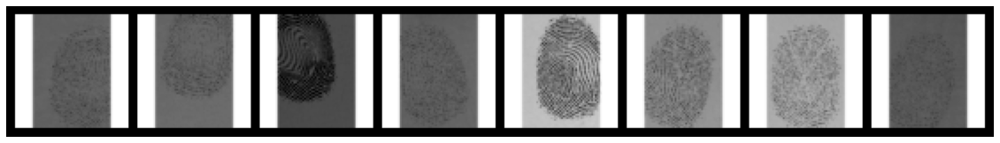

Gabor Enhanced Fingerprint Image


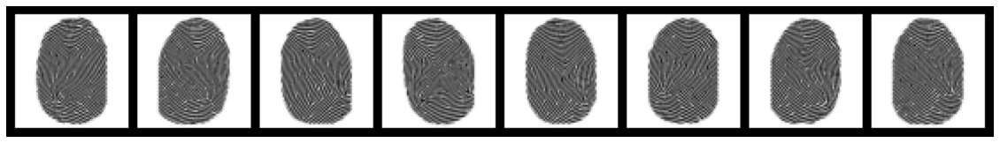

In [173]:
# Create the dataloader
#disp_dataset = dset.ImageFolder(root=data_dir)
disp_fingerprints = [str(finger) for finger in range(1,1000+1)]
disp_dataset = FingerprintLoader(target_dir, template_dir, num_train, disp_fingerprints)
disp_dataloader = torch.utils.data.DataLoader(disp_dataset, batch_size=8,
                                         shuffle=True, num_workers=1)

# Get a Batch of Sample Images
real_batch = next(iter(disp_dataloader))
batch = real_batch

print("Sample Fingerprint Images")
# Display the Sample Images
plt.figure(figsize=(20,6))
plt.subplot(2,1,1)
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(batch[0].to(device)[:8], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()

print("Gabor Enhanced Fingerprint Image")
plt.figure(figsize=(20,6))
plt.subplot(2,1,2)
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(batch[1].to(device)[:8], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()


## Weight Initialization

In [174]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator

In [175]:
class ResNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        """
        Args:
          in_channels (int):  Number of input channels.
          out_channels (int): Number of output channels.
          stride (int):       Controls the stride.
        """
        super(ResNetBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1, stride=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)


    def forward(self, x):
        out = torch.relu(self.bn(self.conv(x)))
        out = self.bn(self.conv(out))
        out += x
        out = F.relu(out)
        return out
    

# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        # Device
        self.ngpu = ngpu
        # Convolutional Layers
        self.conv1   = nn.Conv2d(nc, ngf, 7, 1, 3, bias=False)
        self.conv2   = nn.Conv2d(ngf, ngf * 2, 4, 2, 1, bias=False)
        self.conv3   = nn.Conv2d(ngf * 2, ngf * 4, 4, 2, 1, bias=False)
        self.conv4   = nn.Conv2d(ngf, nc, 7, 1, 3, bias=False)
        # Transpose Convolutional Layers
        self.deconv1 = nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False)
        self.deconv2 = nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False)
        # ResNet Layer
        self.resNet = ResNetBlock(ngf * 4, ngf * 4)
        # Batch Normalization Layers
        self.bn0 = nn.BatchNorm2d(ngf)
        self.bn1 = nn.BatchNorm2d(ngf * 2)
        self.bn2 = nn.BatchNorm2d(ngf * 4)
        self.bn3 = nn.BatchNorm2d(ngf * 8)


    def forward(self, x):
        out = F.relu(self.bn0(self.conv1(x)), True)
        out = F.relu(self.bn1(self.conv2(out)), True)
        out = F.relu(self.bn2(self.conv3(out)), True)
        out = F.relu(self.bn1(self.deconv1(out)), True)
        out = F.relu(self.bn0(self.deconv2(out)), True)
        out = torch.tanh(self.conv4(out))
        return out

In [176]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (deconv1): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (deconv2): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (resNet): ResNetBlock(
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(256, eps=1e-05, m

## Discriminator

In [177]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        # Device
        self.ngpu = ngpu
        # Convolutional Layers
        # Convolutional Layers
        self.conv1   = nn.Conv2d(nc, ngf, 7, 1, 3, bias=False)
        self.conv2   = nn.Conv2d(ngf, ngf * 2, 4, 2, 1, bias=False)
        self.conv3   = nn.Conv2d(ngf * 2, ngf * 4, 4, 2, 1, bias=False)
        self.conv4   = nn.Conv2d(ngf, nc, 7, 1, 3, bias=False)
        # Transpose Convolutional Layers
        self.conv5 = nn.Conv2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False)
        self.conv6 = nn.Conv2d(ngf * 2, nc, 4, 2, 1, bias=False)
        # ResNet Layer
        self.resNet = ResNetBlock(ngf * 4, ngf * 4)
        # Batch Normalization Layers
        self.bn0 = nn.BatchNorm2d(ngf)
        self.bn1 = nn.BatchNorm2d(ngf * 2)
        self.bn2 = nn.BatchNorm2d(ngf * 4)
        self.bn3 = nn.BatchNorm2d(ngf * 8)
        # Fully Connected Layers
        self.fc1 = nn.Linear(144, 32)
        self.fc2 = nn.Linear(16, 1)


    def forward(self, x):
        out = F.leaky_relu_(self.bn0(self.conv1(x)), 0.2)
        out = F.leaky_relu_(self.bn1(self.conv2(out)), 0.2)
        out = F.leaky_relu_(self.bn2(self.conv3(out)), 0.2)
        out = F.leaky_relu_(self.bn1(self.conv5(out)), 0.2)
        out = F.leaky_relu_(self.conv6(out))
        out = out.view(out.shape[0], -1)
        #print(out.shape)
        #out = F.leaky_relu_(self.fc1(out), 0.2)
        #out = F.relu(self.fc2(out), 0.2)
        out = self.fc2(out)
        return torch.sigmoid(out)

In [178]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
  (conv5): Conv2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv6): Conv2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (resNet): ResNetBlock(
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine

## Set Training Params

In [179]:
# create data loaders
torch.manual_seed(1)

kwargs = {}
if device.type == 'cuda':
    torch.cuda.manual_seed(1)
    kwargs = {'num_workers': 1, 'pin_memory': True}

# Create the dataloader
data_loader = get_train_loader(target_dir, template_dir, batch_size,num_train, num_valid, shuffle, **kwargs)

train_loader = data_loader

# Create batch of latent vectors that we will use to visualize the progression of the generator
test_loader = get_train_loader(target_dir, template_dir, 8, num_train, num_valid, shuffle, **kwargs)
test_batch = []
test = next(iter(test_loader))
test_batch.append(test[0].to(device))     
test_batch.append(test[1].to(device))

criterion = nn.BCELoss()

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

sim_label = 1.0
diff_label = 0.0

# Setup Adam optimizers for both G, D, and S
optimizerD = optim.Adam(netD.parameters(), lr=dlr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=glr, betas=(beta1, 0.999))


## GAN Training


[*] Train on 10000 sample pairs

Epoch: 1/100


loss_D: 0.812241435051  loss_G: 1.704702: : 10112it [01:28, 152.51it/s]                        

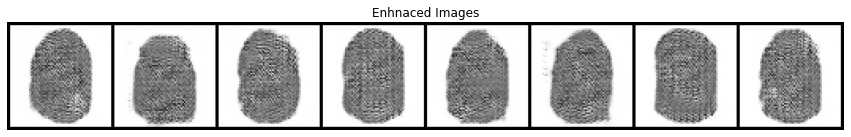

loss_D: 0.812241435051  loss_G: 1.704702: : 10112it [01:29, 113.36it/s]



Epoch: 2/100


loss_D: 0.696759402752  loss_G: 2.132825: 100%|█████████▉| 9984/10000 [01:29<00:00, 117.72it/s]

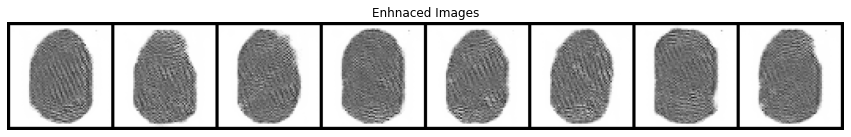

loss_D: 0.696759402752  loss_G: 2.132825: : 10112it [01:30, 111.97it/s]                        



Epoch: 3/100


loss_D: 0.374512016773  loss_G: 4.112294: 100%|█████████▉| 9984/10000 [01:34<00:00, 105.49it/s]

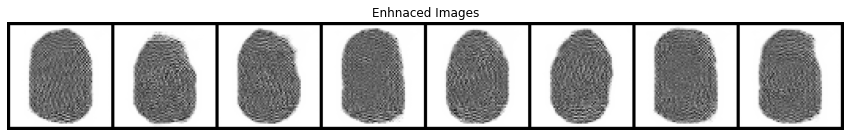

loss_D: 0.374512016773  loss_G: 4.112294: : 10112it [01:35, 105.99it/s]                        



Epoch: 4/100


loss_D: 0.463507711887  loss_G: 3.731787: 100%|█████████▉| 9984/10000 [01:35<00:00, 108.45it/s]

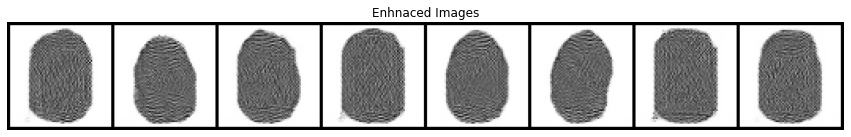

loss_D: 0.463507711887  loss_G: 3.731787: : 10112it [01:41, 99.76it/s]                         



Epoch: 5/100


loss_D: 0.332839637995  loss_G: 3.455730: 100%|█████████▉| 9984/10000 [01:44<00:00, 101.13it/s]

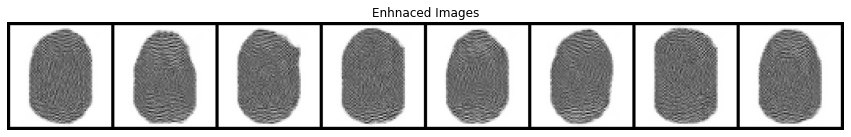

loss_D: 0.332839637995  loss_G: 3.455730: : 10112it [01:45, 96.16it/s]                         



Epoch: 6/100


loss_D: 0.252020984888  loss_G: 3.380466: : 10112it [01:38, 133.05it/s]                        

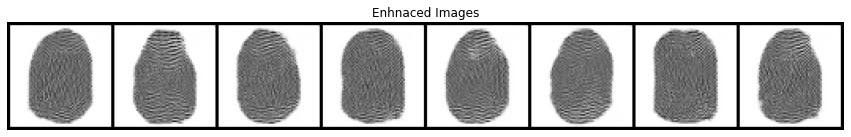

loss_D: 0.252020984888  loss_G: 3.380466: : 10112it [01:39, 101.61it/s]



Epoch: 7/100


loss_D: 0.208456486464  loss_G: 4.215040: : 10112it [01:31, 150.21it/s]                        

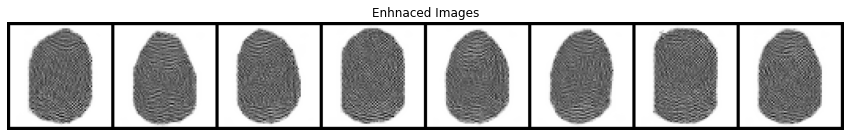

loss_D: 0.208456486464  loss_G: 4.215040: : 10112it [01:32, 109.76it/s]



Epoch: 8/100


loss_D: 0.272855490446  loss_G: 3.299953: 100%|█████████▉| 9984/10000 [01:32<00:00, 99.52it/s] 

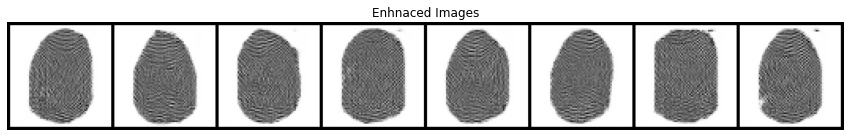

loss_D: 0.272855490446  loss_G: 3.299953: : 10112it [01:33, 108.26it/s]                       



Epoch: 9/100


loss_D: 0.120293796062  loss_G: 3.587085: 100%|█████████▉| 9984/10000 [01:47<00:00, 93.53it/s] 

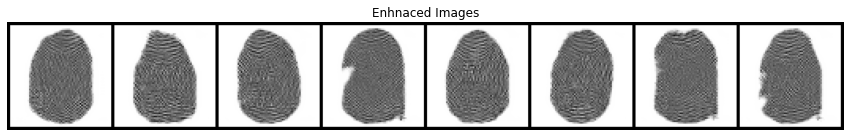

loss_D: 0.120293796062  loss_G: 3.587085: : 10112it [01:48, 93.60it/s]                        



Epoch: 10/100


loss_D: 0.134135305882  loss_G: 3.808100:   1%|▏         | 128/10000 [00:01<01:55, 85.51it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe66b699dc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1481, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1464, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fe66b699dc0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py", line 1481, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.9/dist-packages/torch/utils/dat

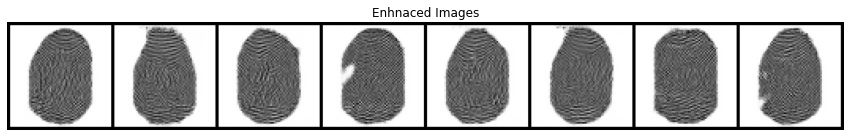

loss_D: 0.153686195612  loss_G: 4.071446: : 10112it [02:14, 75.21it/s]                        



Epoch: 11/100


loss_D: 0.277482032776  loss_G: 4.373061: 100%|█████████▉| 9984/10000 [01:49<00:00, 94.86it/s] 

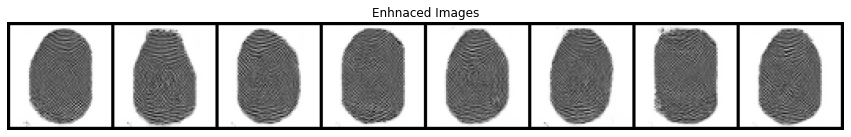

loss_D: 0.277482032776  loss_G: 4.373061: : 10112it [01:50, 91.50it/s]                        



Epoch: 12/100


loss_D: 0.575087606907  loss_G: 6.917883: 100%|█████████▉| 9984/10000 [01:39<00:00, 105.14it/s]

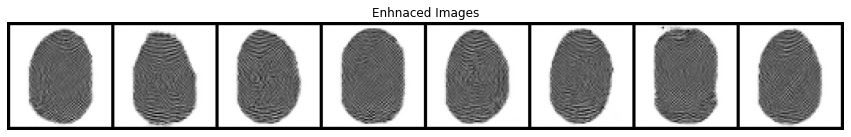

loss_D: 0.575087606907  loss_G: 6.917883: : 10112it [01:39, 101.44it/s]                        



Epoch: 13/100


loss_D: 0.127883732319  loss_G: 3.639216: 100%|█████████▉| 9984/10000 [01:43<00:00, 97.92it/s] 

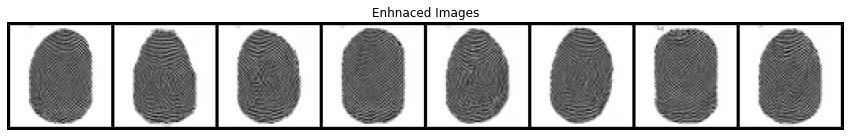

loss_D: 0.127883732319  loss_G: 3.639216: : 10112it [01:44, 96.93it/s]                        



Epoch: 14/100


loss_D: 0.271785646677  loss_G: 3.833076: 100%|█████████▉| 9984/10000 [01:46<00:00, 97.43it/s] 

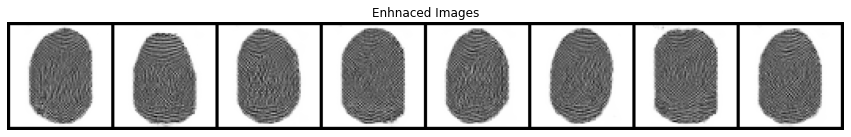

loss_D: 0.271785646677  loss_G: 3.833076: : 10112it [01:47, 94.23it/s]                        



Epoch: 15/100


loss_D: 0.135407760739  loss_G: 3.801398: 100%|█████████▉| 9984/10000 [01:35<00:00, 109.18it/s]

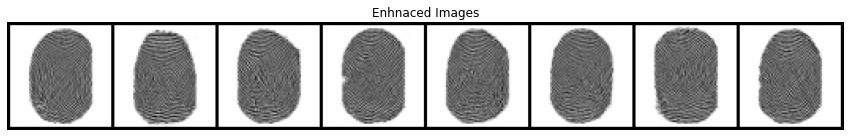

loss_D: 0.135407760739  loss_G: 3.801398: : 10112it [01:35, 105.35it/s]                        



Epoch: 16/100


loss_D: 1.203909397125  loss_G: 1.655013: 100%|█████████▉| 9984/10000 [01:30<00:00, 106.24it/s]

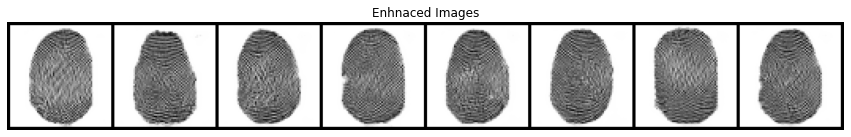

loss_D: 1.203909397125  loss_G: 1.655013: : 10112it [01:32, 109.23it/s]                        



Epoch: 17/100


loss_D: 0.620346188545  loss_G: 2.302489: 100%|█████████▉| 9984/10000 [01:36<00:00, 106.04it/s]

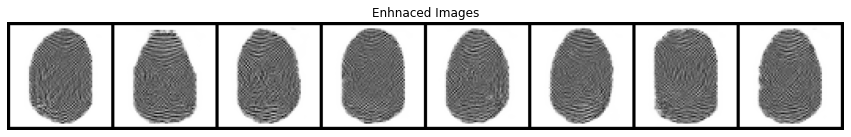

loss_D: 0.620346188545  loss_G: 2.302489: : 10112it [01:36, 104.61it/s]                        



Epoch: 18/100


loss_D: 0.269161880016  loss_G: 2.620397: 100%|█████████▉| 9984/10000 [01:42<00:00, 99.10it/s] 

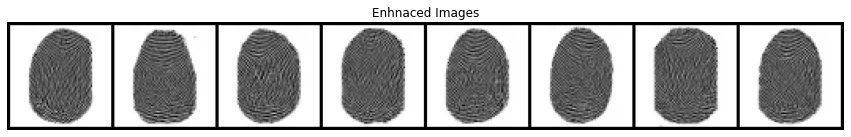

loss_D: 0.269161880016  loss_G: 2.620397: : 10112it [01:43, 97.81it/s]                        



Epoch: 19/100


loss_D: 0.285631239414  loss_G: 3.625515: 100%|█████████▉| 9984/10000 [01:42<00:00, 104.67it/s]

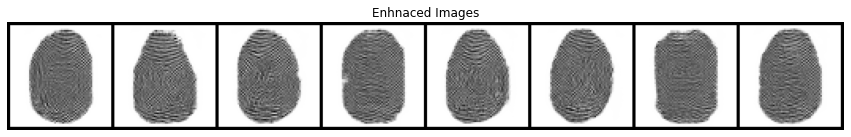

loss_D: 0.285631239414  loss_G: 3.625515: : 10112it [01:43, 98.12it/s]                         



Epoch: 20/100


loss_D: 0.149066448212  loss_G: 5.820468: 100%|█████████▉| 9984/10000 [01:39<00:00, 92.94it/s] 

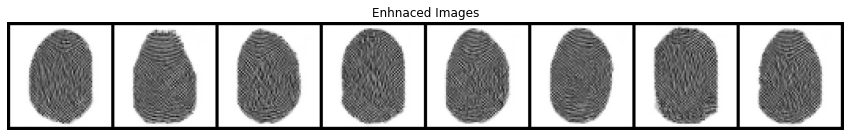

loss_D: 0.149066448212  loss_G: 5.820468: : 10112it [01:40, 100.52it/s]                       



Epoch: 21/100


loss_D: 0.159141227603  loss_G: 3.920845: : 10112it [01:43, 134.11it/s]                        

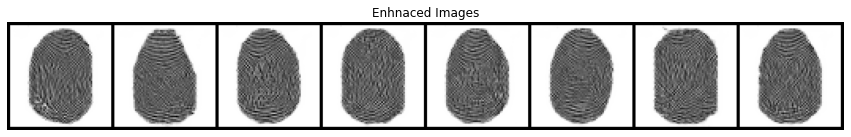

loss_D: 0.159141227603  loss_G: 3.920845: : 10112it [01:44, 96.85it/s] 



Epoch: 22/100


loss_D: 0.191493242979  loss_G: 4.455025: : 10112it [01:41, 137.22it/s]                        

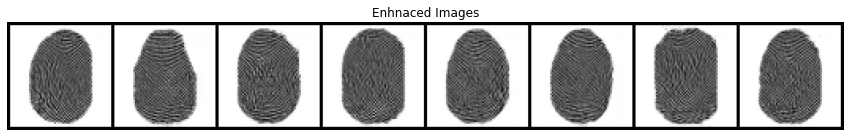

loss_D: 0.191493242979  loss_G: 4.455025: : 10112it [01:41, 99.48it/s] 



Epoch: 23/100


loss_D: 0.117968045175  loss_G: 4.618139: : 10112it [01:36, 135.99it/s]                        

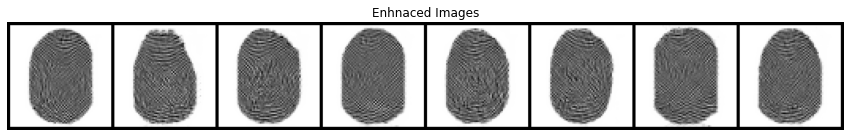

loss_D: 0.117968045175  loss_G: 4.618139: : 10112it [01:37, 103.67it/s]



Epoch: 24/100


loss_D: 0.064497634768  loss_G: 4.304464: 100%|█████████▉| 9984/10000 [01:40<00:00, 107.69it/s]

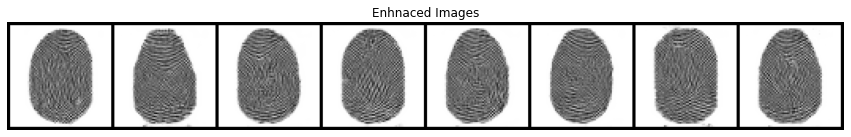

loss_D: 0.064497634768  loss_G: 4.304464: : 10112it [01:41, 99.59it/s]                         



Epoch: 25/100


loss_D: 0.087135821581  loss_G: 5.225868: 100%|█████████▉| 9984/10000 [01:40<00:00, 108.34it/s]

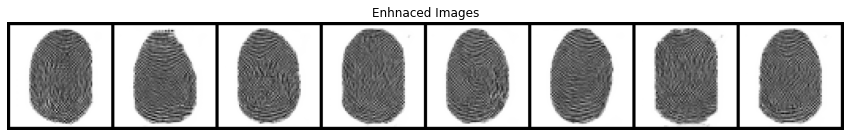

loss_D: 0.087135821581  loss_G: 5.225868: : 10112it [01:43, 97.80it/s]                         



Epoch: 26/100


loss_D: 0.111940219998  loss_G: 4.581620: : 10112it [01:43, 128.38it/s]                        

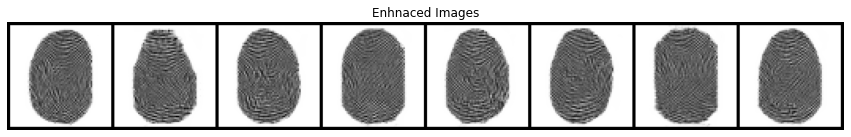

loss_D: 0.111940219998  loss_G: 4.581620: : 10112it [01:44, 96.96it/s] 



Epoch: 27/100


loss_D: 1.921079516411  loss_G: 11.269254: : 10112it [01:38, 139.42it/s]                        

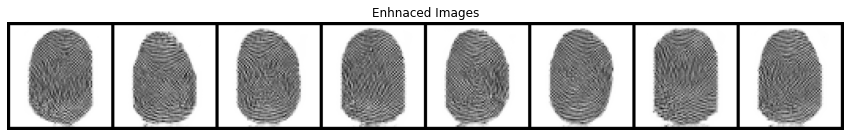

loss_D: 1.921079516411  loss_G: 11.269254: : 10112it [01:39, 101.88it/s]



Epoch: 28/100


loss_D: 1.145677804947  loss_G: 3.245932: 100%|█████████▉| 9984/10000 [01:39<00:00, 109.98it/s]

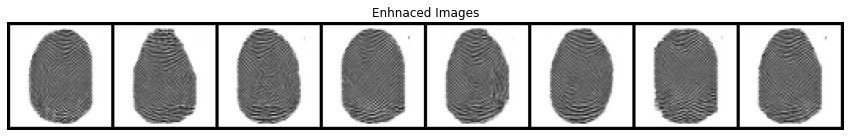

loss_D: 1.145677804947  loss_G: 3.245932: : 10112it [01:40, 101.02it/s]                        



Epoch: 29/100


loss_D: 0.067956194282  loss_G: 4.770924: 100%|█████████▉| 9984/10000 [01:34<00:00, 111.63it/s]

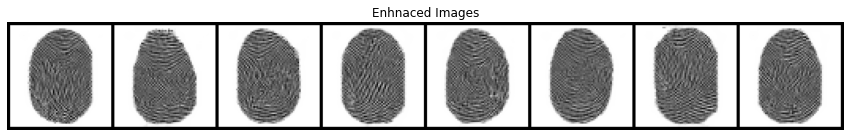

loss_D: 0.067956194282  loss_G: 4.770924: : 10112it [01:35, 106.19it/s]                        



Epoch: 30/100


loss_D: 0.055645991117  loss_G: 4.789493: 100%|█████████▉| 9984/10000 [01:40<00:00, 102.56it/s]

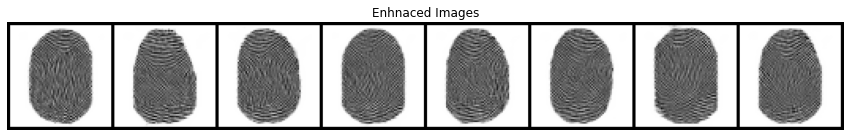

loss_D: 0.055645991117  loss_G: 4.789493: : 10112it [01:43, 97.25it/s]                         



Epoch: 31/100


loss_D: 0.047359794378  loss_G: 5.130479: : 10112it [01:38, 141.14it/s]                        

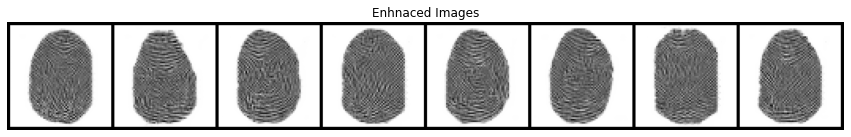

loss_D: 0.047359794378  loss_G: 5.130479: : 10112it [01:39, 101.95it/s]



Epoch: 32/100


loss_D: 0.088351517916  loss_G: 4.492402: 100%|█████████▉| 9984/10000 [01:41<00:00, 109.61it/s]

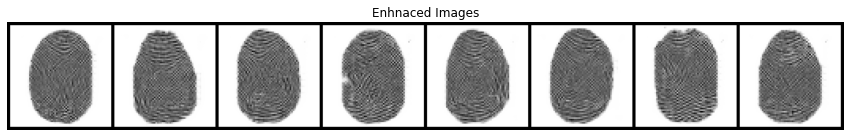

loss_D: 0.088351517916  loss_G: 4.492402: : 10112it [01:42, 99.03it/s]                         



Epoch: 33/100


loss_D: 0.036019325256  loss_G: 6.102758: 100%|█████████▉| 9984/10000 [01:40<00:00, 96.28it/s] 

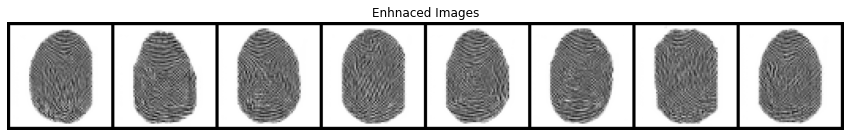

loss_D: 0.036019325256  loss_G: 6.102758: : 10112it [01:40, 100.41it/s]                       



Epoch: 34/100


loss_D: 0.042184926569  loss_G: 5.459812: 100%|█████████▉| 9984/10000 [01:41<00:00, 101.74it/s]

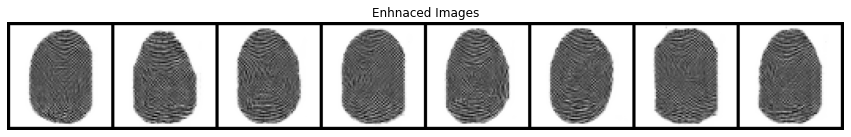

loss_D: 0.042184926569  loss_G: 5.459812: : 10112it [01:42, 98.88it/s]                         



Epoch: 35/100


loss_D: 0.055480435491  loss_G: 5.215852: : 10112it [01:42, 125.90it/s]                        

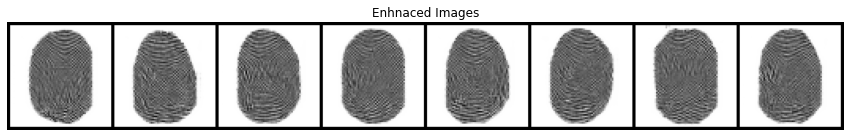

loss_D: 0.055480435491  loss_G: 5.215852: : 10112it [01:42, 98.29it/s] 



Epoch: 36/100


loss_D: 0.029195664451  loss_G: 7.957285: 100%|█████████▉| 9984/10000 [01:36<00:00, 107.34it/s]

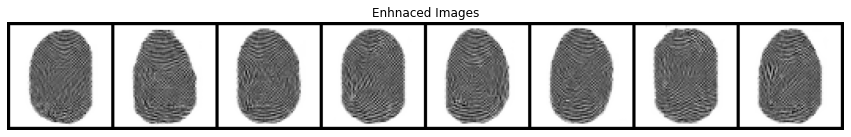

loss_D: 0.029195664451  loss_G: 7.957285: : 10112it [01:45, 95.84it/s]                         



Epoch: 37/100


loss_D: 1.269864320755  loss_G: 1.156503: 100%|█████████▉| 9984/10000 [01:38<00:00, 101.77it/s] 

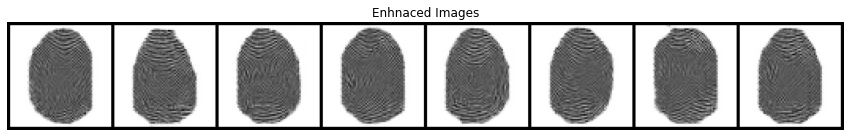

loss_D: 1.269864320755  loss_G: 1.156503: : 10112it [01:40, 100.41it/s]                        



Epoch: 38/100


loss_D: 0.915320396423  loss_G: 3.979139: 100%|█████████▉| 9984/10000 [01:37<00:00, 107.63it/s]

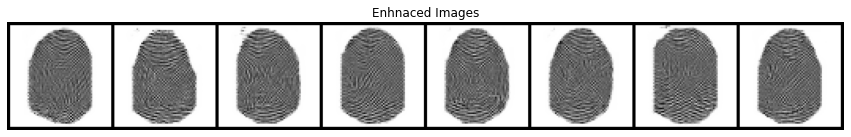

loss_D: 0.915320396423  loss_G: 3.979139: : 10112it [01:38, 103.07it/s]                        



Epoch: 39/100


loss_D: 0.696433961391  loss_G: 2.763332: 100%|█████████▉| 9984/10000 [01:38<00:00, 109.76it/s]

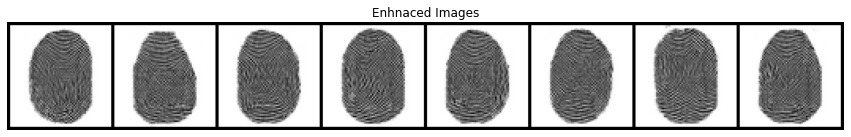

loss_D: 0.696433961391  loss_G: 2.763332: : 10112it [01:39, 101.71it/s]                        



Epoch: 40/100


loss_D: 0.075778149068  loss_G: 5.059682: 100%|█████████▉| 9984/10000 [01:36<00:00, 106.72it/s]

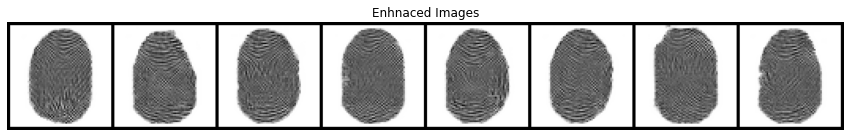

loss_D: 0.075778149068  loss_G: 5.059682: : 10112it [01:37, 104.20it/s]                        



Epoch: 41/100


loss_D: 0.165311783552  loss_G: 8.563184: 100%|█████████▉| 9984/10000 [01:40<00:00, 104.60it/s]

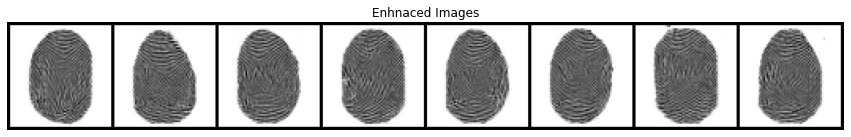

loss_D: 0.165311783552  loss_G: 8.563184: : 10112it [01:40, 100.47it/s]                        



Epoch: 42/100


loss_D: 0.093528196216  loss_G: 4.307189: 100%|█████████▉| 9984/10000 [01:39<00:00, 93.64it/s] 

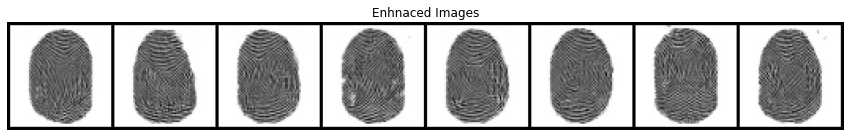

loss_D: 0.093528196216  loss_G: 4.307189: : 10112it [01:39, 101.30it/s]                       



Epoch: 43/100


loss_D: 0.066328488290  loss_G: 4.573775: : 10112it [01:38, 133.48it/s]                        

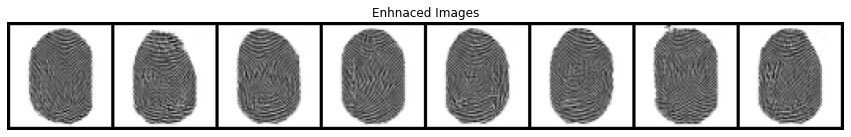

loss_D: 0.066328488290  loss_G: 4.573775: : 10112it [01:40, 100.99it/s]



Epoch: 44/100


loss_D: 0.063846170902  loss_G: 4.931521: 100%|█████████▉| 9984/10000 [01:38<00:00, 90.81it/s] 

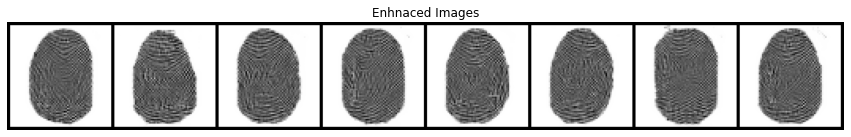

loss_D: 0.063846170902  loss_G: 4.931521: : 10112it [01:38, 102.28it/s]                       



Epoch: 45/100


loss_D: 0.046502776444  loss_G: 5.685014: 100%|█████████▉| 9984/10000 [01:40<00:00, 93.49it/s] 

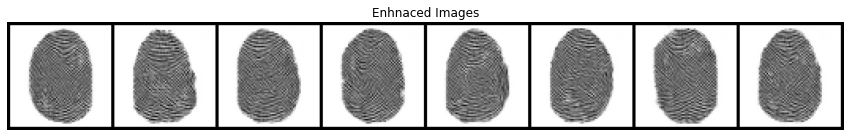

loss_D: 0.046502776444  loss_G: 5.685014: : 10112it [01:41, 99.92it/s]                        



Epoch: 46/100


loss_D: 0.020314775407  loss_G: 6.649591: : 10112it [01:40, 138.30it/s]                        

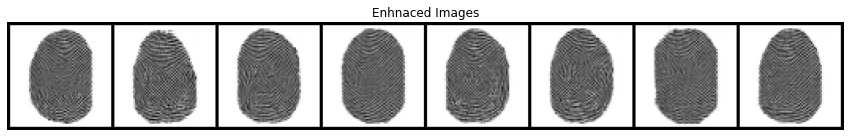

loss_D: 0.020314775407  loss_G: 6.649591: : 10112it [01:41, 99.68it/s] 



Epoch: 47/100


loss_D: 2.045515537262  loss_G: 2.978114: 100%|█████████▉| 9984/10000 [01:38<00:00, 101.36it/s] 

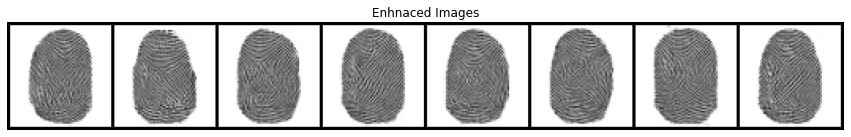

loss_D: 2.045515537262  loss_G: 2.978114: : 10112it [01:38, 102.23it/s]                        



Epoch: 48/100


loss_D: 0.526954531670  loss_G: 2.918674: : 10112it [01:36, 139.89it/s]                        

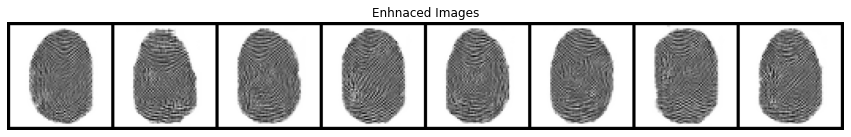

loss_D: 0.526954531670  loss_G: 2.918674: : 10112it [01:37, 103.83it/s]



Epoch: 49/100


loss_D: 0.108575090766  loss_G: 4.792645: : 10112it [01:37, 139.41it/s]                        

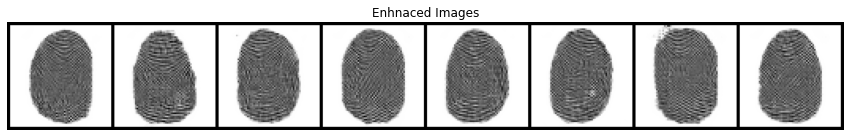

loss_D: 0.108575090766  loss_G: 4.792645: : 10112it [01:38, 102.70it/s]



Epoch: 50/100


loss_D: 0.050535991788  loss_G: 5.009921: 100%|█████████▉| 9984/10000 [01:41<00:00, 93.13it/s] 

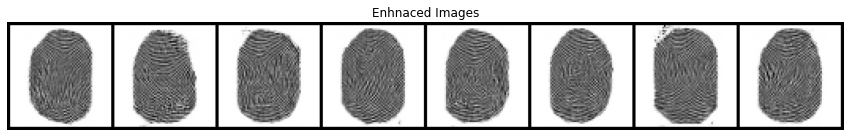

loss_D: 0.050535991788  loss_G: 5.009921: : 10112it [01:42, 98.38it/s]                        



Epoch: 51/100


loss_D: 0.047634124756  loss_G: 5.361891: : 10112it [01:42, 129.22it/s]                        

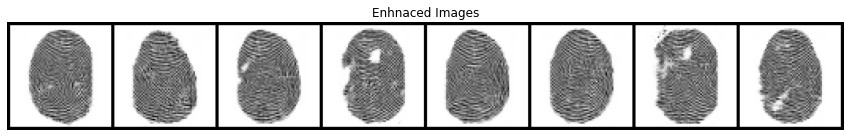

loss_D: 0.047634124756  loss_G: 5.361891: : 10112it [01:43, 97.86it/s] 



Epoch: 52/100


loss_D: 0.062848694623  loss_G: 6.375555: : 10112it [01:42, 137.71it/s]                        

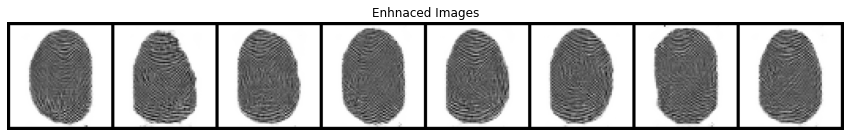

loss_D: 0.062848694623  loss_G: 6.375555: : 10112it [01:43, 97.45it/s] 



Epoch: 53/100


loss_D: 0.025332804769  loss_G: 5.390352: 100%|█████████▉| 9984/10000 [01:39<00:00, 100.51it/s]

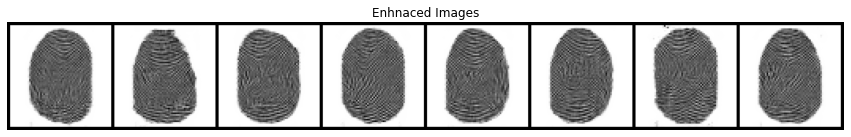

loss_D: 0.025332804769  loss_G: 5.390352: : 10112it [01:39, 101.13it/s]                        



Epoch: 54/100


loss_D: 0.032835859805  loss_G: 4.979315: 100%|█████████▉| 9984/10000 [01:41<00:00, 100.67it/s]

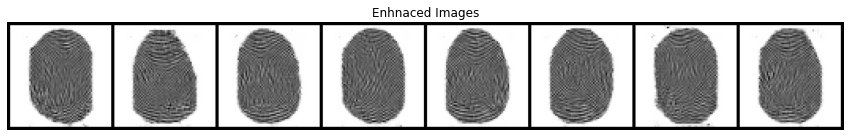

loss_D: 0.032835859805  loss_G: 4.979315: : 10112it [01:42, 98.76it/s]                         



Epoch: 55/100


loss_D: 0.061870716512  loss_G: 4.903310: 100%|█████████▉| 9984/10000 [01:38<00:00, 103.49it/s]

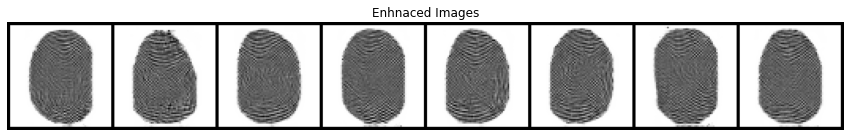

loss_D: 0.061870716512  loss_G: 4.903310: : 10112it [01:39, 101.61it/s]                        



Epoch: 56/100


loss_D: 0.335896432400  loss_G: 2.967086: 100%|█████████▉| 9984/10000 [01:37<00:00, 115.33it/s] 

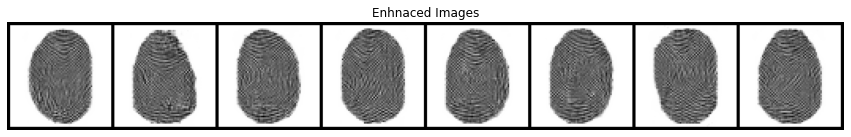

loss_D: 0.335896432400  loss_G: 2.967086: : 10112it [01:37, 103.51it/s]                        



Epoch: 57/100


loss_D: 0.017682764679  loss_G: 6.590944: : 10112it [01:36, 149.19it/s]                        

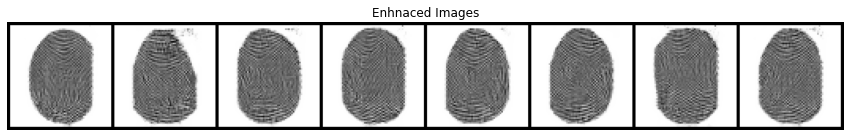

loss_D: 0.017682764679  loss_G: 6.590944: : 10112it [01:37, 103.76it/s]



Epoch: 58/100


loss_D: 0.057671483606  loss_G: 4.624526: : 10112it [01:37, 124.65it/s]                        

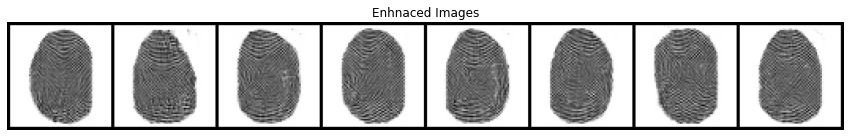

loss_D: 0.057671483606  loss_G: 4.624526: : 10112it [01:38, 102.71it/s]



Epoch: 59/100


loss_D: 0.080194853246  loss_G: 5.009102: 100%|█████████▉| 9984/10000 [01:35<00:00, 106.25it/s]

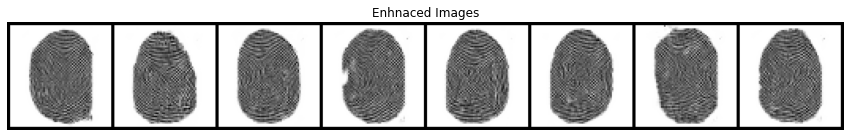

loss_D: 0.080194853246  loss_G: 5.009102: : 10112it [01:36, 104.98it/s]                        



Epoch: 60/100


loss_D: 0.067853137851  loss_G: 3.714763: 100%|█████████▉| 9984/10000 [01:37<00:00, 93.91it/s] 

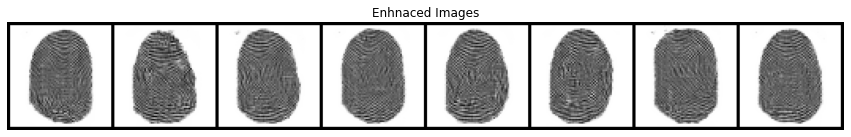

loss_D: 0.067853137851  loss_G: 3.714763: : 10112it [01:38, 103.12it/s]                       



Epoch: 61/100


loss_D: 0.019060231745  loss_G: 5.948371: 100%|█████████▉| 9984/10000 [01:36<00:00, 108.30it/s]

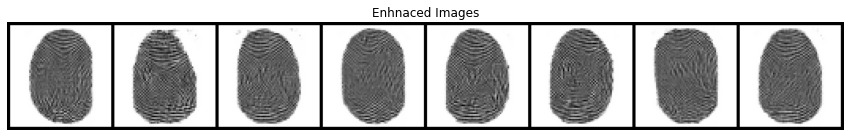

loss_D: 0.019060231745  loss_G: 5.948371: : 10112it [01:36, 104.48it/s]                        



Epoch: 62/100


loss_D: 0.015177475289  loss_G: 6.372055: 100%|█████████▉| 9984/10000 [01:39<00:00, 104.86it/s]

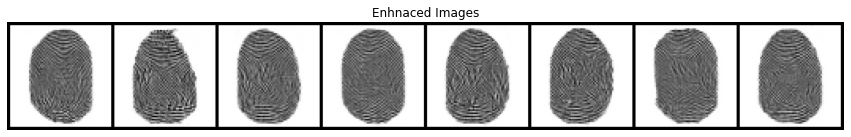

loss_D: 0.015177475289  loss_G: 6.372055: : 10112it [01:40, 100.74it/s]                        



Epoch: 63/100


loss_D: 0.004446722101  loss_G: 6.582047: 100%|█████████▉| 9984/10000 [01:40<00:00, 95.46it/s] 

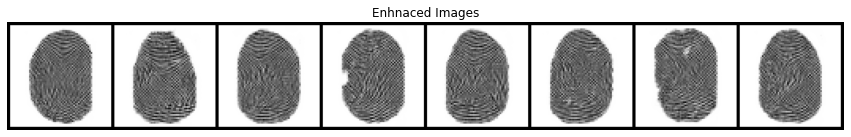

loss_D: 0.004446722101  loss_G: 6.582047: : 10112it [01:41, 99.91it/s]                        



Epoch: 64/100


loss_D: 0.009090020321  loss_G: 6.231539: 100%|█████████▉| 9984/10000 [01:40<00:00, 104.00it/s]

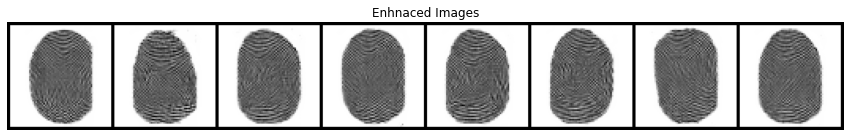

loss_D: 0.009090020321  loss_G: 6.231539: : 10112it [01:41, 100.10it/s]                        



Epoch: 65/100


loss_D: 0.031679511070  loss_G: 6.018910: 100%|█████████▉| 9984/10000 [01:40<00:00, 100.09it/s]

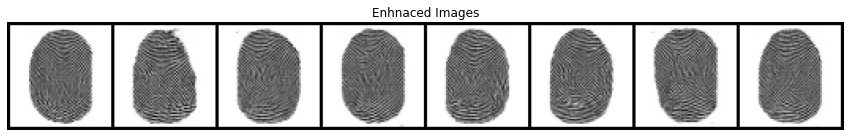

loss_D: 0.031679511070  loss_G: 6.018910: : 10112it [01:41, 99.96it/s]                         



Epoch: 66/100


loss_D: 0.009486884810  loss_G: 6.741918: : 10112it [01:41, 132.45it/s]                        

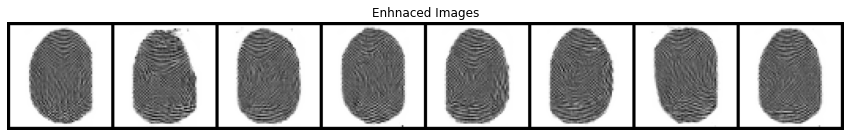

loss_D: 0.009486884810  loss_G: 6.741918: : 10112it [01:42, 98.64it/s] 



Epoch: 67/100


loss_D: 1.139784812927  loss_G: 0.942108: : 10112it [01:40, 130.38it/s]                        

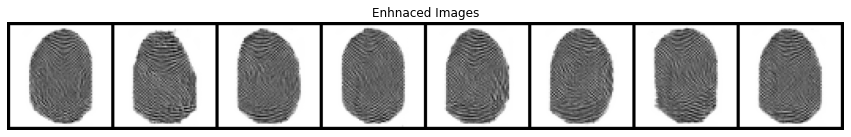

loss_D: 1.139784812927  loss_G: 0.942108: : 10112it [01:41, 99.55it/s] 



Epoch: 68/100


loss_D: 1.008057117462  loss_G: 2.098838: : 10112it [01:39, 118.78it/s]                        

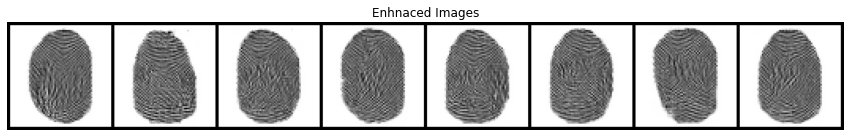

loss_D: 1.008057117462  loss_G: 2.098838: : 10112it [01:40, 101.05it/s]



Epoch: 69/100


loss_D: 1.719815254211  loss_G: 0.713732: : 10112it [01:43, 145.89it/s]                        

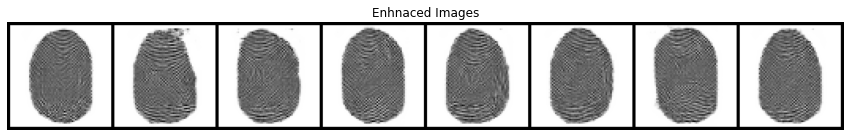

loss_D: 1.719815254211  loss_G: 0.713732: : 10112it [01:43, 97.38it/s] 



Epoch: 70/100


loss_D: 0.529207825661  loss_G: 9.608500: : 10112it [01:39, 130.87it/s]                        

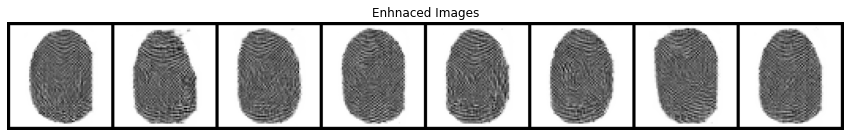

loss_D: 0.529207825661  loss_G: 9.608500: : 10112it [01:39, 101.16it/s]



Epoch: 71/100


loss_D: 0.096554942429  loss_G: 5.169792: 100%|█████████▉| 9984/10000 [01:38<00:00, 103.70it/s]

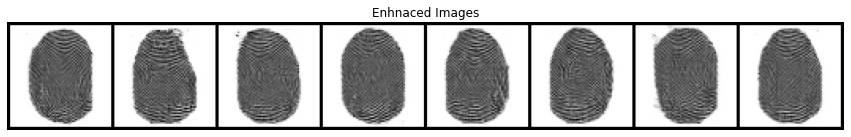

loss_D: 0.096554942429  loss_G: 5.169792: : 10112it [01:38, 102.46it/s]                        



Epoch: 72/100


loss_D: 0.470389783382  loss_G: 2.844496: 100%|█████████▉| 9984/10000 [01:37<00:00, 97.07it/s] 

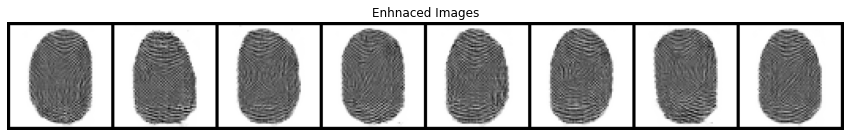

loss_D: 0.470389783382  loss_G: 2.844496: : 10112it [01:37, 103.30it/s]                       



Epoch: 73/100


loss_D: 0.037145629525  loss_G: 4.908881: 100%|█████████▉| 9984/10000 [01:42<00:00, 91.93it/s] 

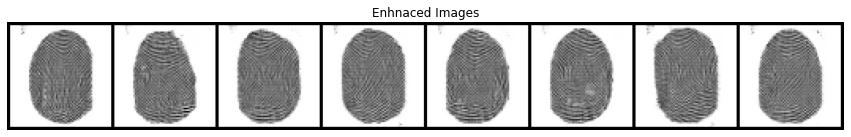

loss_D: 0.037145629525  loss_G: 4.908881: : 10112it [01:43, 97.91it/s]                        



Epoch: 74/100


loss_D: 0.031861435622  loss_G: 5.480041: 100%|█████████▉| 9984/10000 [01:39<00:00, 98.95it/s] 

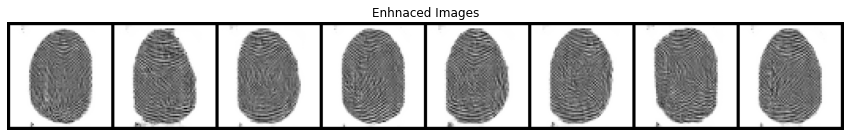

loss_D: 0.031861435622  loss_G: 5.480041: : 10112it [01:39, 101.22it/s]                       



Epoch: 75/100


loss_D: 0.197065681219  loss_G: 5.514018: : 10112it [01:40, 133.62it/s]                         

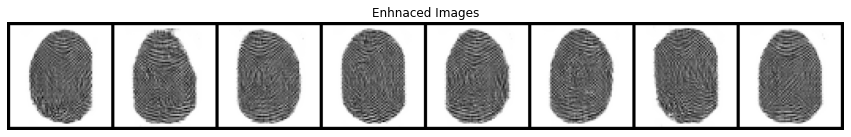

loss_D: 0.197065681219  loss_G: 5.514018: : 10112it [01:42, 98.47it/s] 



Epoch: 76/100


loss_D: 0.030456271023  loss_G: 5.830151: 100%|█████████▉| 9984/10000 [01:48<00:00, 93.93it/s] 

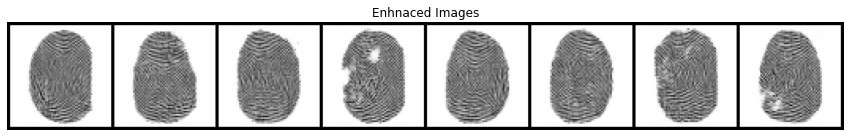

loss_D: 0.030456271023  loss_G: 5.830151: : 10112it [01:49, 92.39it/s]                        



Epoch: 77/100


loss_D: 0.071197479963  loss_G: 5.934875: 100%|█████████▉| 9984/10000 [01:37<00:00, 109.71it/s]

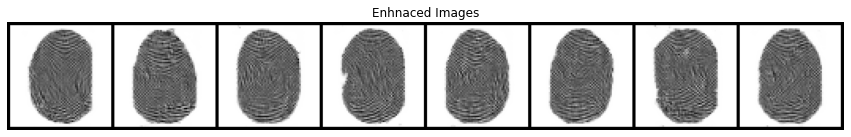

loss_D: 0.071197479963  loss_G: 5.934875: : 10112it [01:38, 103.11it/s]                        



Epoch: 78/100


loss_D: 0.007591667119  loss_G: 8.475783: : 10112it [01:40, 142.89it/s]                        

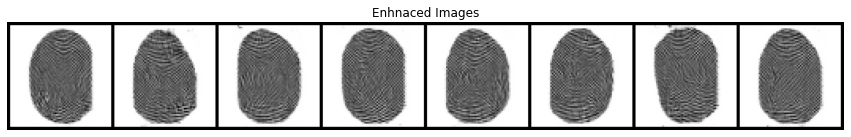

loss_D: 0.007591667119  loss_G: 8.475783: : 10112it [01:40, 100.19it/s]



Epoch: 79/100


loss_D: 0.032846581191  loss_G: 5.717930: : 10112it [01:43, 134.32it/s]                        

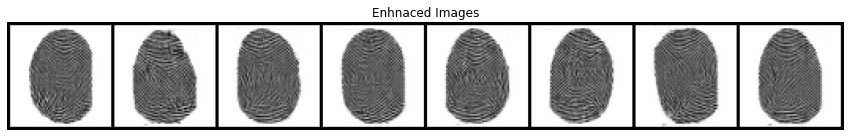

loss_D: 0.032846581191  loss_G: 5.717930: : 10112it [01:43, 97.30it/s] 



Epoch: 80/100


loss_D: 0.124062165618  loss_G: 8.181099: 100%|█████████▉| 9984/10000 [01:42<00:00, 100.37it/s]

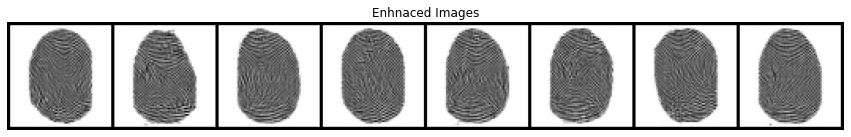

loss_D: 0.124062165618  loss_G: 8.181099: : 10112it [01:43, 98.13it/s]                         



Epoch: 81/100


loss_D: 0.060327675194  loss_G: 4.309526: 100%|█████████▉| 9984/10000 [01:41<00:00, 92.64it/s] 

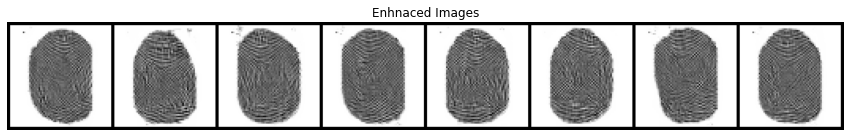

loss_D: 0.060327675194  loss_G: 4.309526: : 10112it [01:42, 99.04it/s]                        



Epoch: 82/100


loss_D: 0.027776168659  loss_G: 5.791005: 100%|█████████▉| 9984/10000 [01:40<00:00, 94.52it/s] 

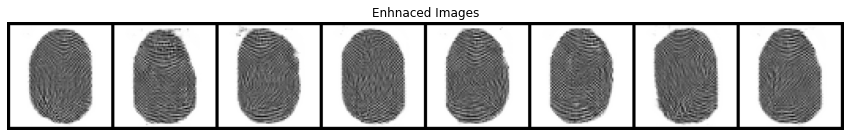

loss_D: 0.027776168659  loss_G: 5.791005: : 10112it [01:40, 100.24it/s]                       



Epoch: 83/100


loss_D: 0.026745215058  loss_G: 6.322587: 100%|█████████▉| 9984/10000 [01:34<00:00, 106.23it/s]

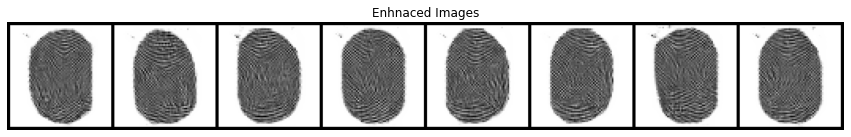

loss_D: 0.026745215058  loss_G: 6.322587: : 10112it [01:35, 105.75it/s]                        



Epoch: 84/100


loss_D: 0.050273627043  loss_G: 5.739754: 100%|█████████▉| 9984/10000 [01:37<00:00, 108.01it/s]

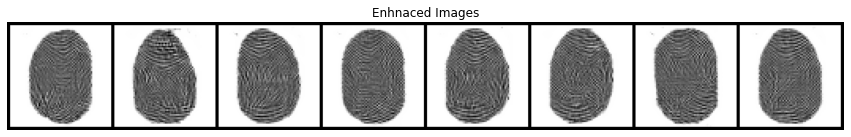

loss_D: 0.050273627043  loss_G: 5.739754: : 10112it [01:42, 98.91it/s]                         



Epoch: 85/100


loss_D: 0.017200944945  loss_G: 6.156471: : 10112it [01:40, 119.01it/s]                        

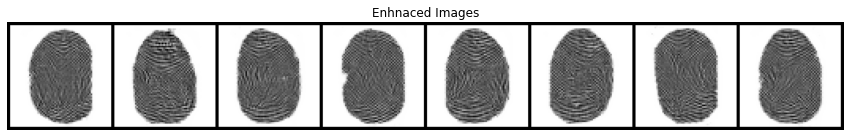

loss_D: 0.017200944945  loss_G: 6.156471: : 10112it [01:41, 99.89it/s] 



Epoch: 86/100


loss_D: 0.177747085690  loss_G: 5.098907: 100%|█████████▉| 9984/10000 [01:34<00:00, 116.92it/s]

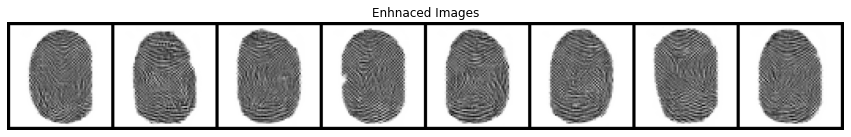

loss_D: 0.177747085690  loss_G: 5.098907: : 10112it [01:35, 105.39it/s]                        



Epoch: 87/100


loss_D: 0.026783719659  loss_G: 5.300437: 100%|█████████▉| 9984/10000 [01:37<00:00, 111.21it/s]

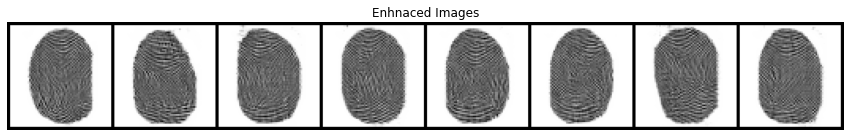

loss_D: 0.026783719659  loss_G: 5.300437: : 10112it [01:37, 103.29it/s]                        



Epoch: 88/100


loss_D: 0.104098401964  loss_G: 5.127945: 100%|█████████▉| 9984/10000 [01:37<00:00, 106.50it/s]

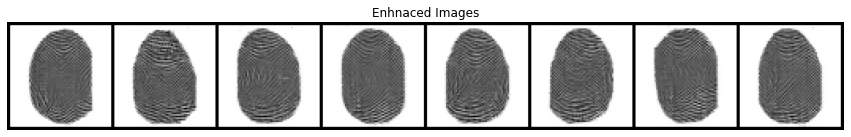

loss_D: 0.104098401964  loss_G: 5.127945: : 10112it [01:39, 101.44it/s]                        



Epoch: 89/100


loss_D: 0.014610485174  loss_G: 7.402441: 100%|█████████▉| 9984/10000 [01:38<00:00, 105.88it/s]

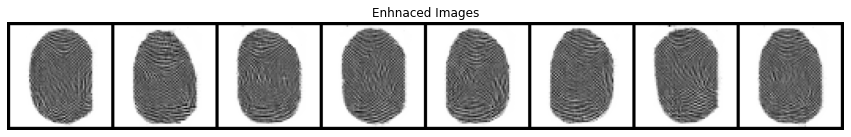

loss_D: 0.014610485174  loss_G: 7.402441: : 10112it [01:39, 101.54it/s]                        



Epoch: 90/100


loss_D: 0.378543496132  loss_G: 12.979638: : 10112it [01:36, 138.86it/s]                        

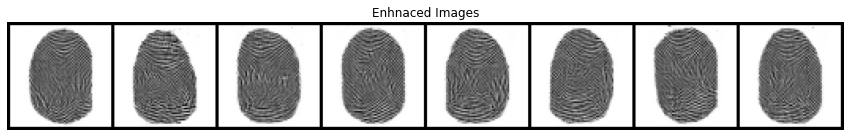

loss_D: 0.378543496132  loss_G: 12.979638: : 10112it [01:37, 103.69it/s]



Epoch: 91/100


loss_D: 0.065678238869  loss_G: 5.280763: 100%|█████████▉| 9984/10000 [01:37<00:00, 95.64it/s] 

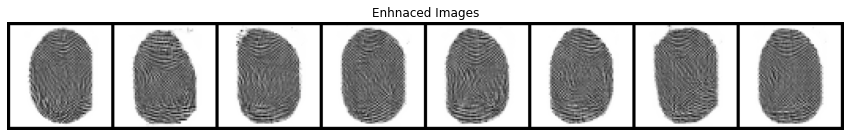

loss_D: 0.065678238869  loss_G: 5.280763: : 10112it [01:37, 103.29it/s]                       



Epoch: 92/100


loss_D: 0.056800302118  loss_G: 5.235116:   4%|▍         | 384/10000 [00:03<01:34, 101.37it/s]

In [ ]:
# Train

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []

errS = 0
iters = 0
# switch to train mode
netG.train()
netD.train()
# Load checkpoint
if os.path.isfile(model_ckpt_file):
    checkpoint = torch.load(model_ckpt_file)
    netG.load_state_dict(checkpoint['netG_state_dict'])
    netD.load_state_dict(checkpoint['netD_state_dict'])
    optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
    optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])
    G_losses = checkpoint['G_losses']
    D_losses = checkpoint['D_losses']
    img_list = checkpoint['img_list']
    test_batch = checkpoint['test_batch']
    iters = checkpoint['iters']
    start_epoch = checkpoint['epoch']

print("\n[*] Train on {} sample pairs".format(
    num_train, num_valid)
)

gLossMvAvg = MovingAvg()

for epoch in range(1, num_epochs+1):
    print('\nEpoch: {}/{}'.format(epoch, num_epochs)) 
    train_batch_time = AverageMeter()
    train_losses = AverageMeter()
    matching_correct = 0
    total_matched = 0
    tic = time.time()
    with tqdm(total=num_train) as pbar:
        for i, (x1, enhanced_x1) in enumerate(train_loader): 
            x1, enhanced_x1 = x1.to(device), enhanced_x1.to(device)

            ############################
            # Update D network
            ###########################
            ## Train with all-Gabor Enhanced batch
            netD.zero_grad()
            # Format batch
            b_size = enhanced_x1.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = netD(enhanced_x1)
            output = output.view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()
            
            ## Train with all-GAN_Enhanced batch
            GAN_Enhanced = netG(x1)
            label.fill_(fake_label)
            # Classify all GAN_Enhanced batch with D
            output = netD(GAN_Enhanced.detach()).view(-1)
            # Calculate D's loss on the all-GAN_Enhanced batch
            errD_GAN_Enhanced = criterion(output, label)
            # Calculate the gradients for this batch
            errD_GAN_Enhanced.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-GAN_Enhanced batches
            errD = errD_real + errD_GAN_Enhanced
            # Update D
            optimizerD.step()
            
            
            ############################
            # Update G network
            ############################
            netG.zero_grad()
            label.fill_(real_label)  # GAN_Enhanced labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-GAN_Enhanced batch through D
            output = netD(GAN_Enhanced).view(-1)
            # Calculate G's loss based on this output
            errG_quality = criterion(output, label)
            # Calculate gradients for G
            errG_quality.backward()
            D_G_z2 = output.mean().item()

            # Add the gradients
            errG = errG_quality 

            # Update G
            optimizerG.step()
            
            # store batch statistics
            toc = time.time()
            train_batch_time.update(toc-tic)
            tic = time.time()
            pbar.set_description(
                (
                    "loss_D: {:.12f}  loss_G: {:.6f}".format(
                        errD.item(), errG.item()
                    )
                )
            )
            pbar.update(batch_size)
            
            gLossMvAvg.push(errG.item())
            
            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())
            
            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 10000 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
                with torch.no_grad():
                    fake = netG(test_batch[0]).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
                saveCkpt(model_ckpt_file, epoch, netG, netD, optimizerG, optimizerD, G_losses, D_losses, img_list, test_batch, iters)

            iters += 1   
        # Plot the fake images from the last epoch
        saveCkpt(model_ckpt_file, epoch, netG, netD, optimizerG, optimizerD, G_losses, D_losses, img_list, test_batch, iters)
        plotFigures(netG, test_batch)
  
# Save results
saveCkpt(model_ckpt_file, epoch, netG, netD, optimizerG, optimizerD, G_losses, D_losses, img_list, test_batch, iters)

## Results

### Training Loss

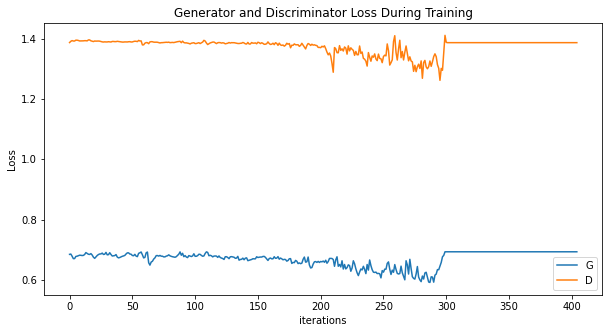

In [319]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Animation of Generator Progression.

Below is an animation of the generator's progression throughout training. Note, for each frame, the generator was fed the same batch of sample images as input.

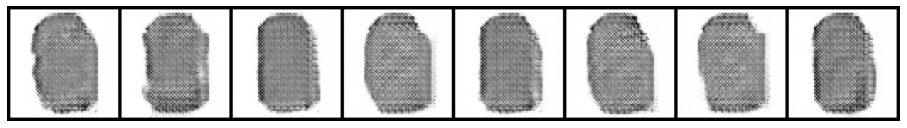

In [320]:
#%%capture
fig = plt.figure(figsize=(16,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Side by Side Comparison of Real and Fake Images
* Left: Real Images
* Middle: Generated Images
* Right: Real Images

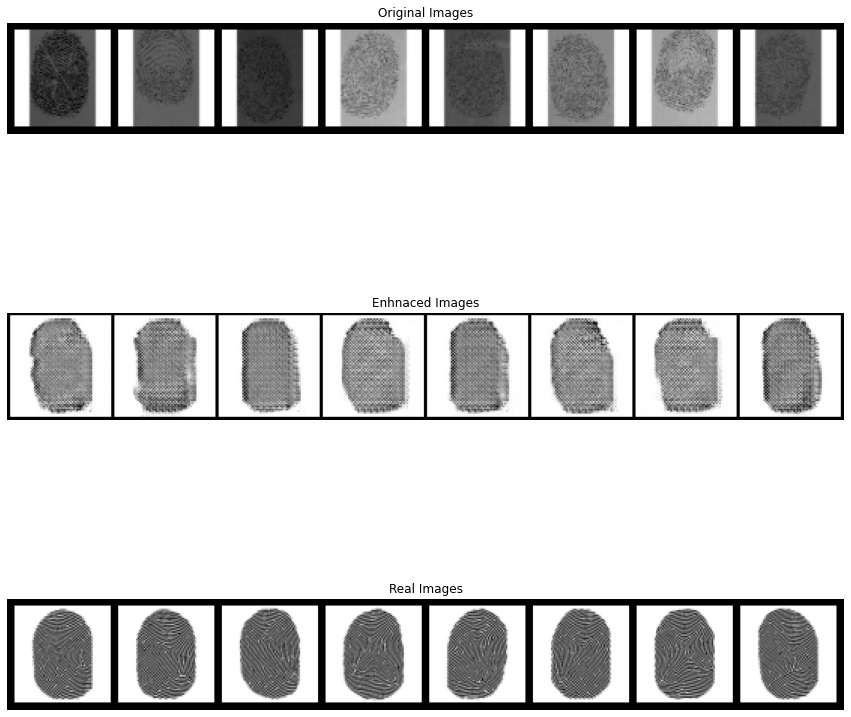

In [321]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(test_loader))

# Plot the noisy images
plt.figure(figsize=(15,15))
plt.subplot(3,1,1)
plt.axis("off")
plt.title("Original Images")
plt.imshow(np.transpose(vutils.make_grid(test_batch[0].to(device)[:], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(3,1,2)
plt.axis("off")
plt.title("Enhnaced Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))

# Plot the real images
plt.subplot(3,1,3)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(test_batch[1].to(device)[:], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()